In [1]:
import os
import face_recognition
import pandas as pd

In [2]:
import warnings
warnings.filterwarnings('ignore')

Function which returns a list of facial features

In [3]:
def get_features(path):
    image = face_recognition.load_image_file(path)
    face_features = face_recognition.face_encodings(image)
    if len(face_features):
        #print(f'Features found on {file}')
        features = {}
        for i,feat in enumerate(face_features[0]):
            features[f'feat_{i}']=feat
        return features
    return False

Empty dataframe to store features from training dataset

In [4]:
df=pd.DataFrame([])
ext=['.jpg','.jpeg','.png']
people=[p for p in os.listdir(f'train') if os.path.isdir(f'train/{p}')]
for person in people:
    files = os.listdir(f'train/{person}')
    print(f'Processing {person}')
    for file in files:
        path = f'train/{person}/{file}'
        if path.endswith(tuple(ext)):
            newRow = get_features(path)
            if newRow:
                newRow['label'] = person
                df = df.append([newRow])
            else:
                print(f'No face found on train/{person}/{file}')
        else:
            print(f'No jpeg file in /{person}/{file}')

Processing Howard
No face found on train/Howard/howard10.png
No face found on train/Howard/howard21.png
No face found on train/Howard/howard76.png
No face found on train/Howard/howard91.png
No face found on train/Howard/howard96.png
Processing Leonard
No face found on train/Leonard/leonard36.png
Processing Raj
No face found on train/Raj/raj57.png
No face found on train/Raj/raj58.png
Processing Sheldon
No face found on train/Sheldon/sheldon11.png
No face found on train/Sheldon/sheldon38.png
No face found on train/Sheldon/sheldon7.png
No face found on train/Sheldon/sheldon95.png


In [5]:
df.reset_index(drop=True, inplace=True)
df.head()

,feat_0,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_119,feat_120,feat_121,feat_122,feat_123,feat_124,feat_125,feat_126,feat_127,label
0,-0.123334,0.077526,0.097220,-0.020790,-0.163508,0.107837,-0.016878,-0.006668,0.196102,-0.067085,...,0.095192,0.040388,0.094799,-0.122012,-0.085343,0.040899,-0.161032,0.020604,0.073695,Howard
1,-0.015503,0.055321,0.124688,0.004051,-0.098093,0.106417,0.025344,-0.084171,0.173716,-0.103850,...,0.045247,-0.011707,0.057843,-0.187921,-0.090312,0.030120,-0.104569,-0.002210,0.046851,Howard
2,-0.069571,0.029705,0.090708,-0.000194,-0.166018,0.095246,0.001188,-0.020188,0.129881,-0.072556,...,0.085840,0.043878,0.092666,-0.161679,-0.088654,-0.012006,-0.192893,-0.055589,0.024476,Howard
3,-0.111462,0.071194,0.079516,-0.025768,-0.139903,0.041234,-0.035852,-0.082575,0.207032,-0.108154,...,0.052124,0.034354,0.045129,-0.129752,-0.147732,0.011145,-0.078391,0.077637,0.047111,Howard
4,-0.038645,0.062366,0.075978,-0.003070,-0.162991,0.132951,-0.054334,-0.034602,0.128548,-0.072284,...,0.089247,-0.015810,0.046114,-0.147881,-0.057654,0.003540,-0.166675,0.053693,0.048043,Howard


## Generate model

We need to assign a numeric value to the labels (the value to be predicted) and split the data set into train data (80%) and test data (20%).

In [6]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

X = df.drop(columns=['label'])
y = df.label

le = preprocessing.LabelEncoder()
y_numeric = le.fit_transform(y)
y_numeric

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_numeric,
    test_size=0.2,
    random_state=123
)


print(X.shape,y.shape)

(325, 128) (325,)


Having numeric features... Random Forest Classifier seems to be the best model choice...

In [7]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

## Train the model

In [8]:
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

pd.DataFrame({
    "pred": le.inverse_transform(y_pred),
    "real": le.inverse_transform(y_test),
    "match": le.inverse_transform(y_pred) == le.inverse_transform(y_test)
})

,pred,real,match
0,Sheldon,Sheldon,True
1,Sheldon,Sheldon,True
2,Sheldon,Sheldon,True
3,Sheldon,Sheldon,True
4,Raj,Raj,True
...,...,...,...
60,Howard,Howard,True
61,Howard,Howard,True
62,Raj,Raj,True
63,Sheldon,Sheldon,True


Confusion Matrix:

<AxesSubplot: >

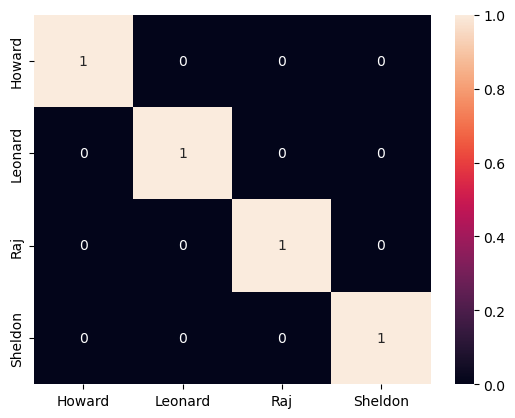

In [9]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(le.inverse_transform(y_test), le.inverse_transform(y_pred), normalize="true")
sns.heatmap(cm, annot=True,xticklabels=le.classes_, yticklabels=le.classes_,)

# Predict from image

## Get faces from image

In [10]:
from PIL import Image
import face_recognition
import matplotlib.pyplot as plt

### Function to return faces from an image

In [11]:
def get_faces(path):
    image = face_recognition.load_image_file(path)
    face_locations = face_recognition.face_locations(image)
    faces = []
    for i, face in enumerate(face_locations):
        top, right, bottom, left = face
        faces.append(image[top:bottom, left:right])
    return faces

### Function to display all faces found on an image

In [12]:
def show_faces(path):
    faces = get_faces(path)
    plt.figure(figsize=(22,20))
    for i, face in enumerate(faces):
        plt.subplot(10, 6, i+1)
        plt.imshow(face)
        plt.axis('off')

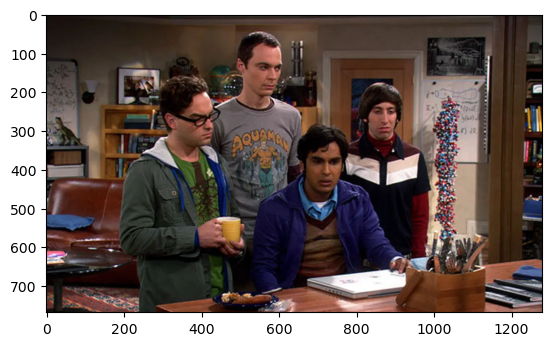

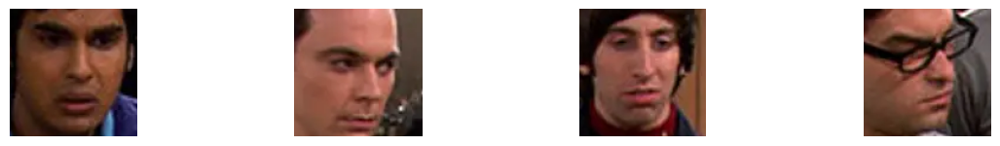

In [13]:
path = "test/big-bang-theory-cast.jpg"
plt.imshow(face_recognition.load_image_file(path))
show_faces(path)

## Make a prediction

### Function to predict a face

In [14]:
def predict(path, is_image=False):
    X_predict = get_predict_features(path, is_image)
    if len(X_predict) == 0:
        return []
    y_predict = model.predict(X_predict)
    return le.inverse_transform(y_predict)

### Function to get predicted features

In [15]:
def get_predict_features(image, is_image):
    if not is_image:
        image = face_recognition.load_image_file(image)
    face_features = face_recognition.face_encodings(image)
    df_predicted = pd.DataFrame([])
    for face_feature in face_features:
        features = {}
        for i, feat in enumerate(face_feature):
            features[f'feat_{i}'] = feat
        df_predicted = df_predicted.append([features])
    return df_predicted

### Function to draw a rectangle

In [16]:
def rect(top, right, bottom, left):
    return [
        [left, right, right, left, left],
        [bottom, bottom, top, top, bottom]
    ]

### Function to display results of the prediction

In [17]:
def show_faces_in_picture(path):
    image = face_recognition.load_image_file(path)
    face_locations = face_recognition.face_locations(image)
    face_names = predict(path)
    if len(face_names):
        plt.figure(figsize=(20, 20))
        plt.imshow(image)
        for i, face in enumerate(face_locations):
            top, right, bottom, left = face
            plt.plot(*rect(top, right, bottom, left), c="w")
            plt.text(left, bottom + 40, face_names[i], c="w", size='xx-large')

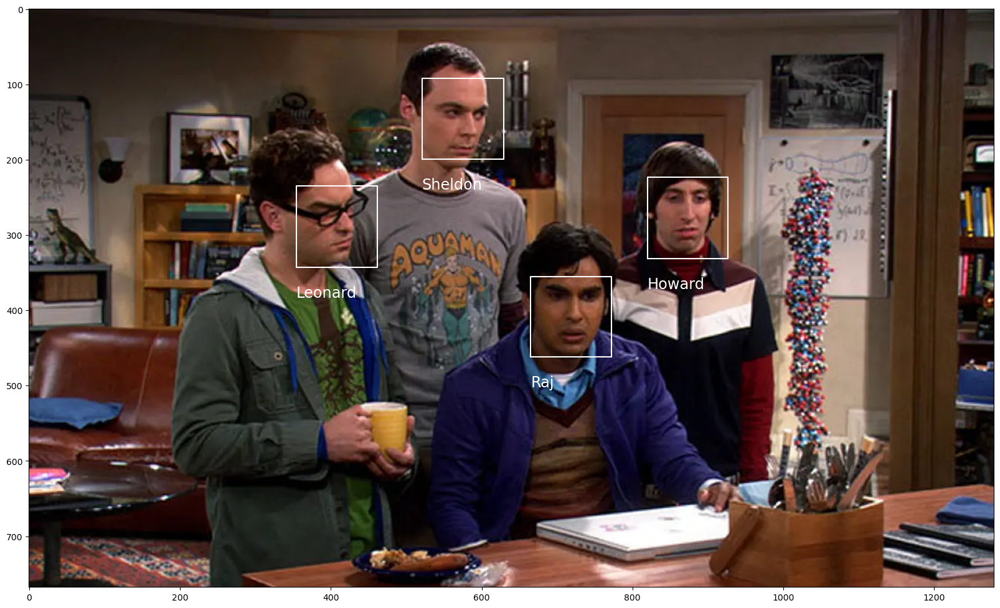

In [18]:
show_faces_in_picture(path)

Testing other images

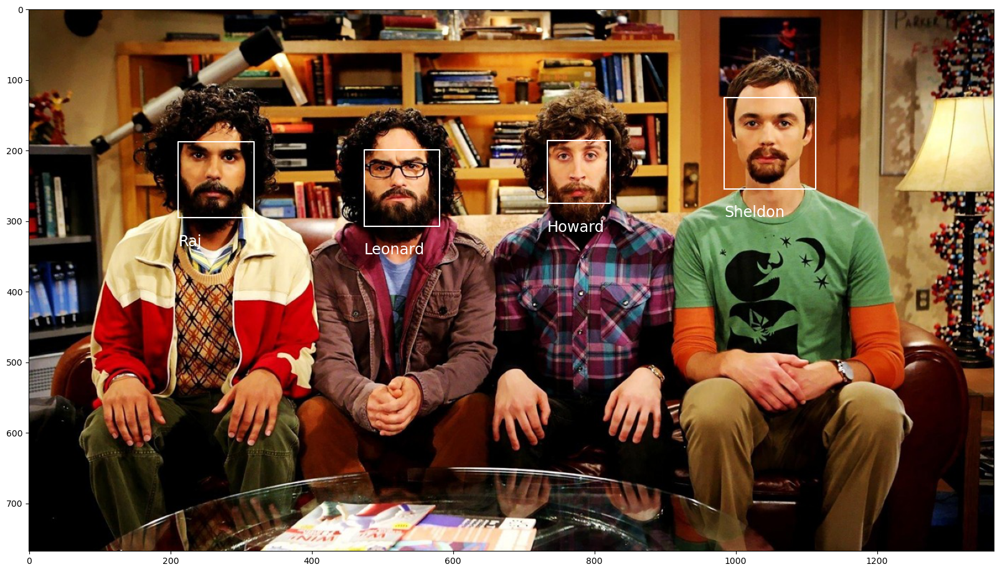

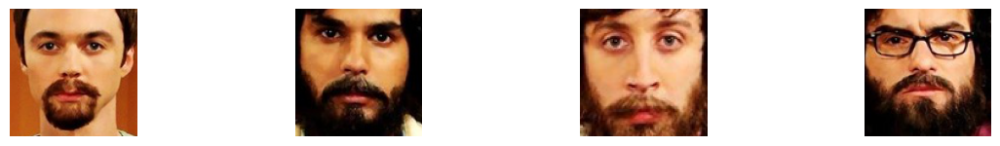

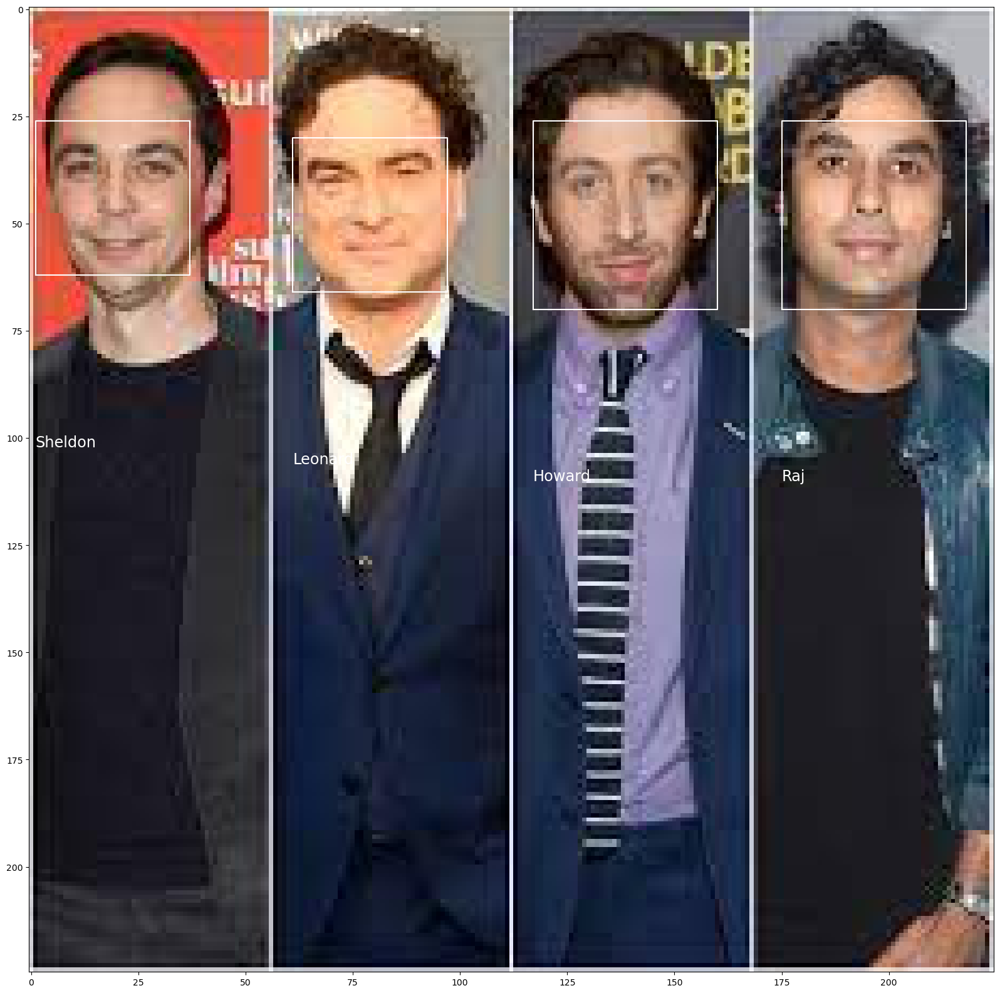

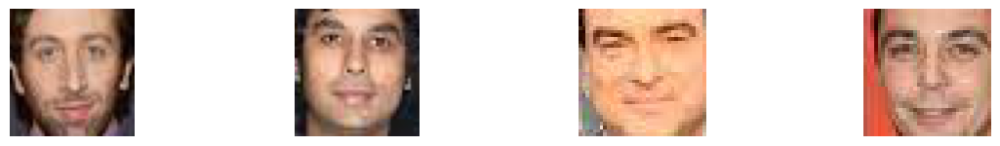

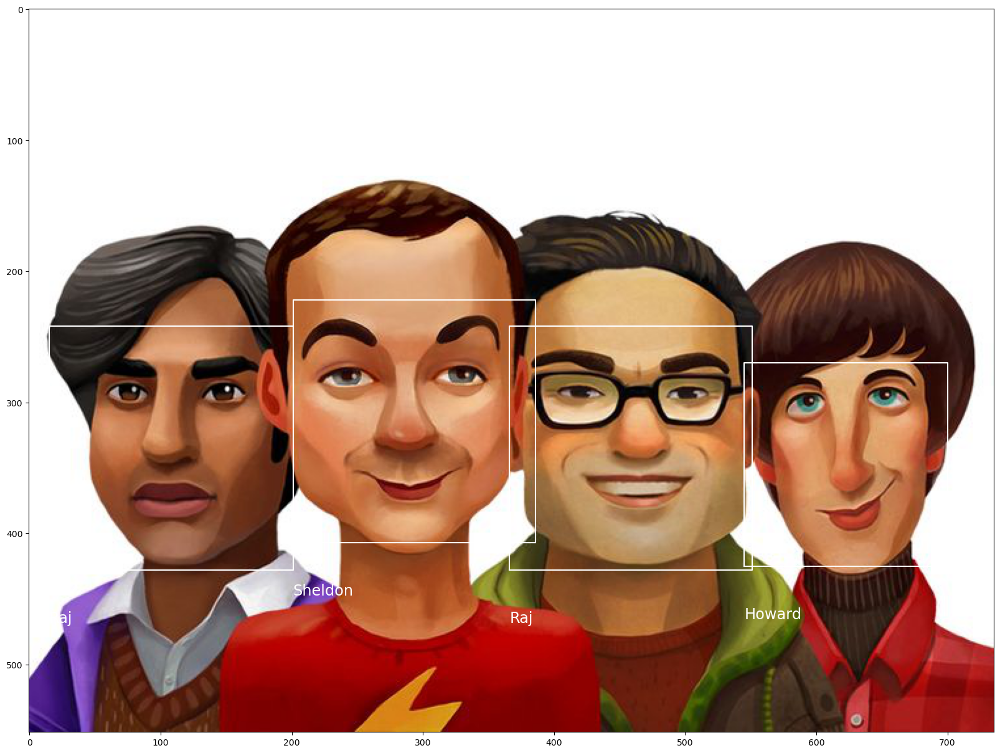

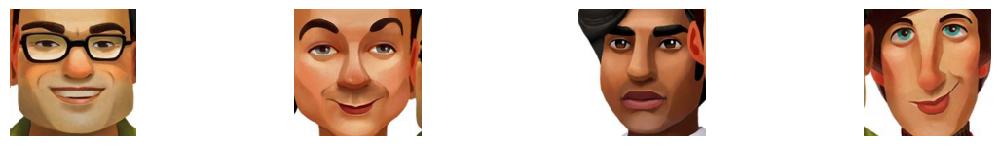

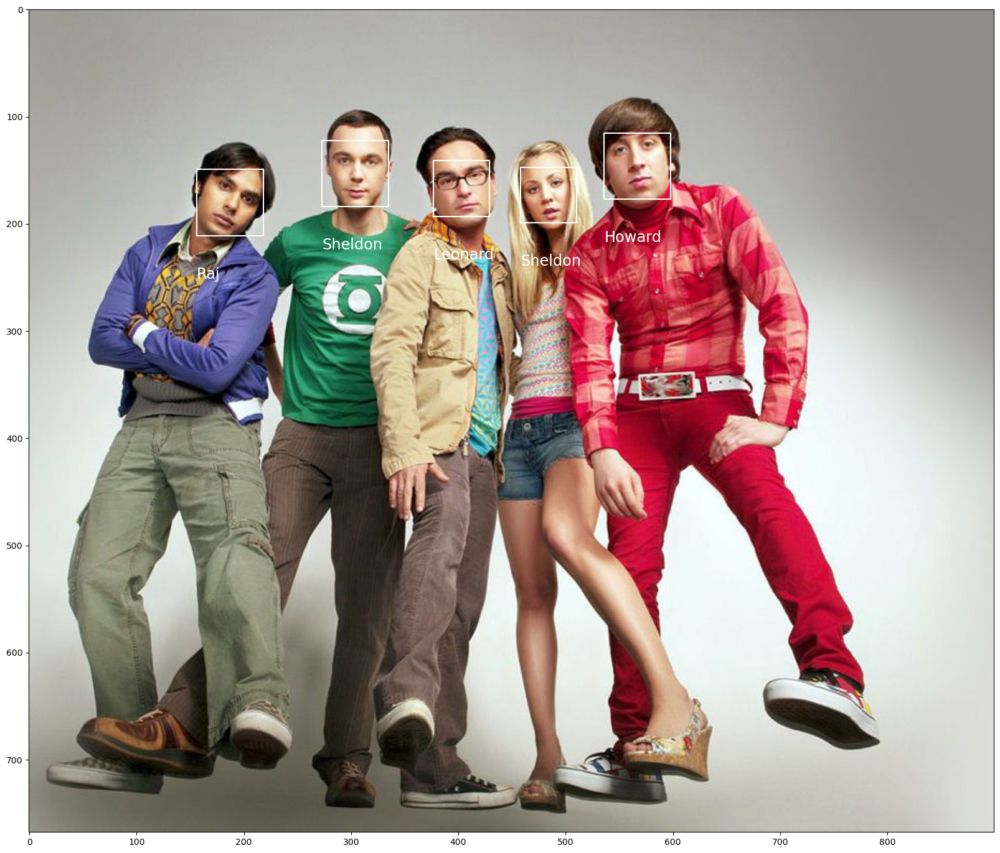

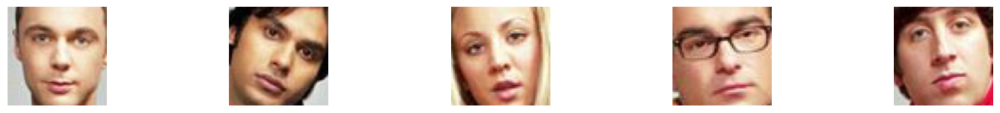

In [19]:
import os

base_path = f'test/others'
test_dir = os.listdir(base_path)

for file in test_dir:
    path = f'{base_path}/{file}'
    show_faces_in_picture(path)
    show_faces(path)
